# League of legends - Winner prediction project
## EDA
###### by zzznavarrete

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Esta linea permite que los gráficos sean renderizados directamente en nuestro notebook
%matplotlib inline

In [3]:
df_matches = pd.read_csv("./data/lol.x_train.csv")

In [4]:
# datset length
len(df_matches)

180000

In [5]:
df_matches.head()

,Unnamed: 0,gameDuraton,blueFirstBlood,blueFirstTower,blueFirstBaron,blueFirstDragon,blueFirstInhibitor,blueDragonKills,blueBaronKills,blueTowerKills,...,redTotalMinionKills,redTotalLevel,redAvgLevel,redJungleMinionKills,redKillingSpree,redTotalHeal,redObjectDamageDealt,Rank_Challenger,Rank_GrandMaster,Rank_Master
0,0,1906,0,1,1,1,1,3,2,9,...,677,74,14.8,134,9,52184,15764,0,1,0
1,1,1454,0,1,1,1,0,3,1,4,...,502,61,12.2,123,7,13236,15042,0,0,1
2,2,1449,1,1,0,0,0,3,0,4,...,556,67,13.4,105,5,13959,46455,0,1,0
3,3,1832,0,0,0,0,0,0,0,3,...,592,79,15.8,239,13,38586,80341,0,0,1
4,4,1098,0,0,0,0,0,0,0,1,...,215,89,17.8,0,18,24834,9434,0,0,1


In [6]:
df_matches_y = pd.read_csv("./data/lol.y_train.csv")

In [7]:
df_matches_y

,Unnamed: 0,blueWins
0,0,1
1,1,1
2,2,0
3,3,0
4,4,0
...,...,...
179995,179995,1
179996,179996,1
179997,179997,0
179998,179998,0


In [8]:
df_matches['blueWins'] = df_matches_y['blueWins']

In [9]:
df_matches.columns

Index(['Unnamed: 0', 'gameDuraton', 'blueFirstBlood', 'blueFirstTower',
       'blueFirstBaron', 'blueFirstDragon', 'blueFirstInhibitor',
       'blueDragonKills', 'blueBaronKills', 'blueTowerKills',
       'blueInhibitorKills', 'blueWardPlaced', 'blueWardkills', 'blueKills',
       'blueDeath', 'blueAssist', 'blueChampionDamageDealt', 'blueTotalGold',
       'blueTotalMinionKills', 'blueTotalLevel', 'blueAvgLevel',
       'blueJungleMinionKills', 'blueKillingSpree', 'blueTotalHeal',
       'blueObjectDamageDealt', 'redFirstBaron', 'redFirstDragon',
       'redFirstInhibitor', 'redDragonKills', 'redBaronKills', 'redTowerKills',
       'redInhibitorKills', 'redWardPlaced', 'redWardkills', 'redKills',
       'redDeath', 'redAssist', 'redChampionDamageDealt', 'redTotalGold',
       'redTotalMinionKills', 'redTotalLevel', 'redAvgLevel',
       'redJungleMinionKills', 'redKillingSpree', 'redTotalHeal',
       'redObjectDamageDealt', 'Rank_Challenger', 'Rank_GrandMaster',
       'Rank_Master

In [10]:
df_matches = df_matches.iloc[:,1:]

In [11]:
df_matches.dtypes

gameDuraton                  int64
blueFirstBlood               int64
blueFirstTower               int64
blueFirstBaron               int64
blueFirstDragon              int64
blueFirstInhibitor           int64
blueDragonKills              int64
blueBaronKills               int64
blueTowerKills               int64
blueInhibitorKills           int64
blueWardPlaced               int64
blueWardkills                int64
blueKills                    int64
blueDeath                    int64
blueAssist                   int64
blueChampionDamageDealt      int64
blueTotalGold                int64
blueTotalMinionKills         int64
blueTotalLevel               int64
blueAvgLevel               float64
blueJungleMinionKills        int64
blueKillingSpree             int64
blueTotalHeal                int64
blueObjectDamageDealt        int64
redFirstBaron                int64
redFirstDragon               int64
redFirstInhibitor            int64
redDragonKills               int64
redBaronKills       

In [12]:
df_matches['gameDurationMinutes'] = df_matches.apply(lambda x: round(x['gameDuraton']/60,1), axis=1)

In [13]:
df_matches['gameDurationMinutes']

0         31.8
1         24.2
2         24.2
3         30.5
4         18.3
          ... 
179995    11.3
179996    17.7
179997    24.1
179998    18.3
179999    12.1
Name: gameDurationMinutes, Length: 180000, dtype: float64

In [14]:
cols = df_matches.columns.tolist()
cols = cols[-1:] + cols[:-1]
df_matches = df_matches[cols]

In [15]:
df_matches.describe()

,gameDurationMinutes,gameDuraton,blueFirstBlood,blueFirstTower,blueFirstBaron,blueFirstDragon,blueFirstInhibitor,blueDragonKills,blueBaronKills,blueTowerKills,...,redTotalLevel,redAvgLevel,redJungleMinionKills,redKillingSpree,redTotalHeal,redObjectDamageDealt,Rank_Challenger,Rank_GrandMaster,Rank_Master,blueWins
count,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000,...,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000
mean,23.897488,1433.840383,0.506417,0.515911,0.236850,0.403989,0.383089,1.357122,0.297956,4.346922,...,64.919106,12.983821,125.821456,5.682533,24783.643228,36907.188461,0.134417,0.329389,0.536194,0.496167
std,7.200999,432.037757,0.499960,0.499748,0.425151,0.490697,0.486141,1.254191,0.534926,3.377698,...,14.925502,2.985100,66.836866,3.630526,15411.891358,26907.350033,0.341100,0.469993,0.498690,0.499987
min,2.200000,132.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,18.800000,1126.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,55.000000,11.000000,84.000000,3.000000,13618.000000,12781.000000,0.000000,0.000000,0.000000,0.000000
50%,23.700000,1420.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,4.000000,...,66.000000,13.200000,128.000000,5.000000,21737.500000,32484.500000,0.000000,0.000000,1.000000,0.000000
75%,28.900000,1732.000000,1.000000,1.000000,0.000000,1.000000,1.000000,2.000000,1.000000,7.000000,...,75.000000,15.000000,172.000000,8.000000,32596.000000,57326.000000,0.000000,1.000000,1.000000,1.000000
max,62.600000,3758.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000,4.000000,11.000000,...,139.000000,27.800000,488.000000,29.000000,206758.000000,197135.000000,1.000000,1.000000,1.000000,1.000000


<AxesSubplot:>

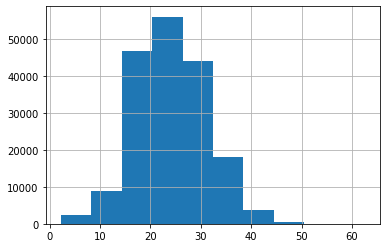

In [16]:
# some histograms

df_matches['gameDurationMinutes'].hist()

<AxesSubplot:>

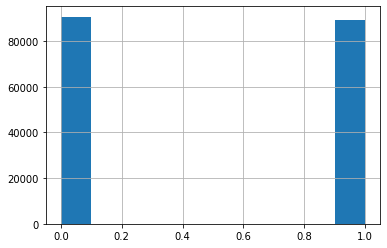

In [17]:
# Bernoulli distribution
df_matches['blueWins'].hist()

In [18]:
#sns.heatmap(df_matches[cols[:26]], annot=True)

In [19]:
#cols[:25]

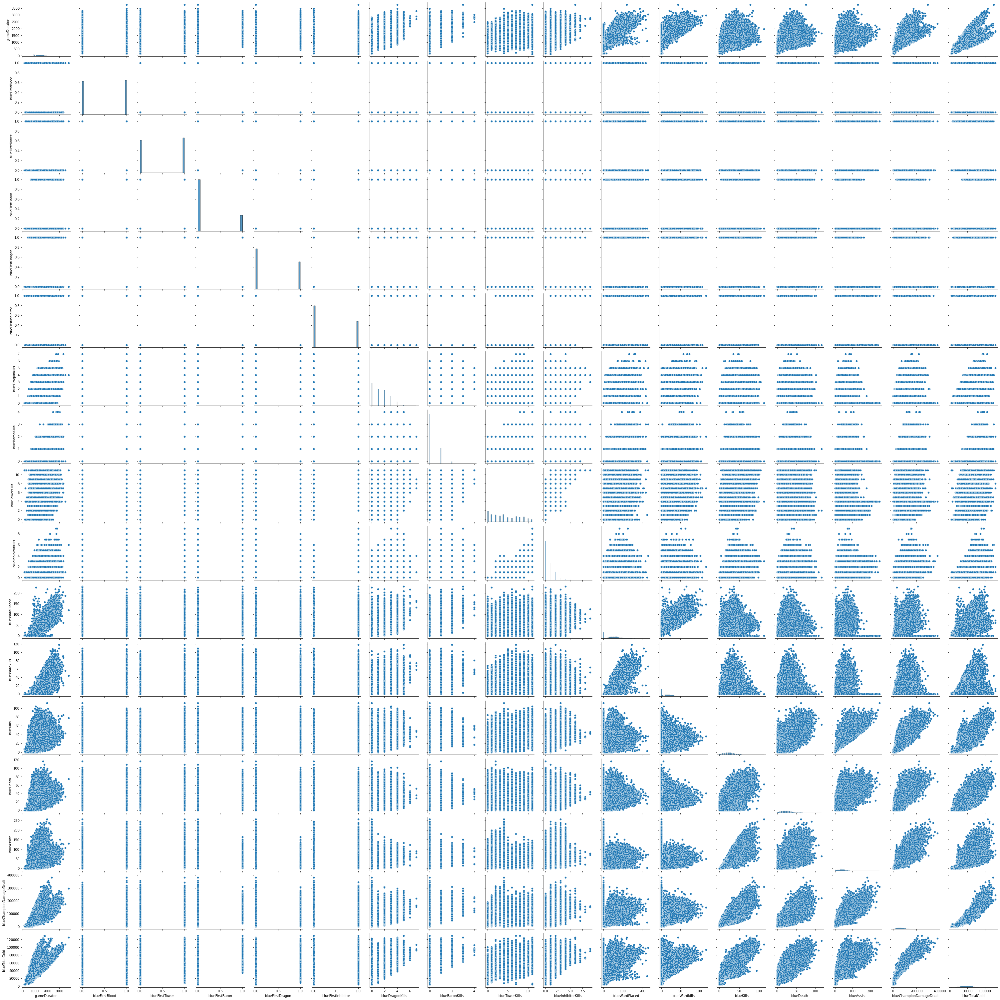

In [20]:
sns.pairplot(df_matches[cols[1:18]])

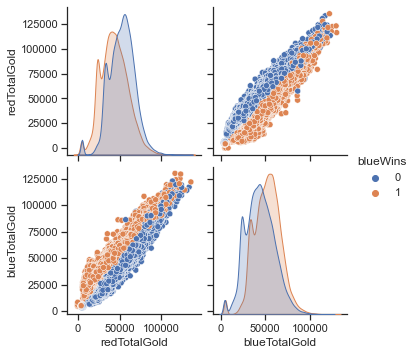

In [21]:
sns.set(style='ticks', color_codes=True)
sns.pairplot(df_matches, vars=['redTotalGold','blueTotalGold'], hue='blueWins')

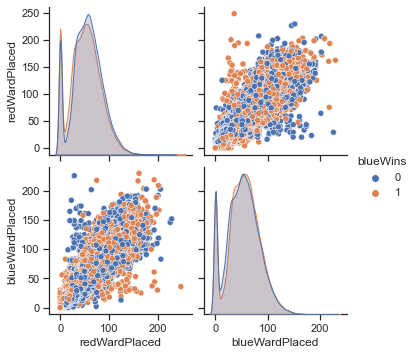

In [22]:
sns.set(style='ticks', color_codes=True)
sns.pairplot(df_matches, vars=['redWardPlaced','blueWardPlaced'], hue='blueWins')

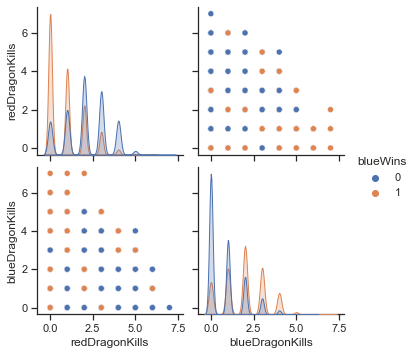

In [23]:
# Dragon kills seems to be a differentiator in terms of who will win, aswell as the gold earned
sns.set(style='ticks', color_codes=True)
sns.pairplot(df_matches, vars=['redDragonKills','blueDragonKills'], hue='blueWins')

### Will try to cluster the data if there's something that could apport to our ongoing next XGBoost model

In [24]:
# Reducing dataset

In [25]:
df_matches_small = df_matches.iloc[:len(df_matches)//5, :]
df_matches_small.shape

(36000, 50)

In [26]:
cluster_features = ['gameDurationMinutes', 'blueFirstBlood','blueDragonKills','redDragonKills','blueFirstBaron', 'redFirstBaron', 'blueWardPlaced', 'redWardPlaced', 'blueKills', 'redKills', 'blueDeath', 'redDeath', 'blueChampionDamageDealt','redChampionDamageDealt', 'blueWins']
df_matches_small = df_matches_small[cluster_features]
df_matches_small.head()

,gameDurationMinutes,blueFirstBlood,blueDragonKills,redDragonKills,blueFirstBaron,redFirstBaron,blueWardPlaced,redWardPlaced,blueKills,redKills,blueDeath,redDeath,blueChampionDamageDealt,redChampionDamageDealt,blueWins
0,31.8,0,3,1,1,0,62,84,43,26,26,43,135355,100705,1
1,24.2,0,3,0,1,0,48,49,40,25,25,40,75736,70660,1
2,24.2,1,3,1,0,1,69,71,20,21,21,20,71486,58082,0
3,30.5,0,0,4,0,0,59,67,28,48,48,28,74430,113195,0
4,18.3,0,0,0,0,0,0,0,41,58,58,41,96554,126815,0


In [27]:
from hdbscan import HDBSCAN
hdbscan = HDBSCAN(min_cluster_size= 20,
                min_samples=10)

In [28]:
clusters = hdbscan.fit(df_matches_small)
#

In [29]:
set(clusters.labels_)

{-1, 0, 1, 2}

In [30]:
df_matches_small['cluster'] = clusters.labels_

In [31]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score

In [32]:
print("silhouette_score =",silhouette_score(df_matches_small, clusters.labels_))
print("calinski_harabasz_score =",calinski_harabasz_score(df_matches_small, clusters.labels_))

silhouette_score = 0.5214471158520425
calinski_harabasz_score = 2014.1582239039203


<Figure size 1872x1152 with 0 Axes>

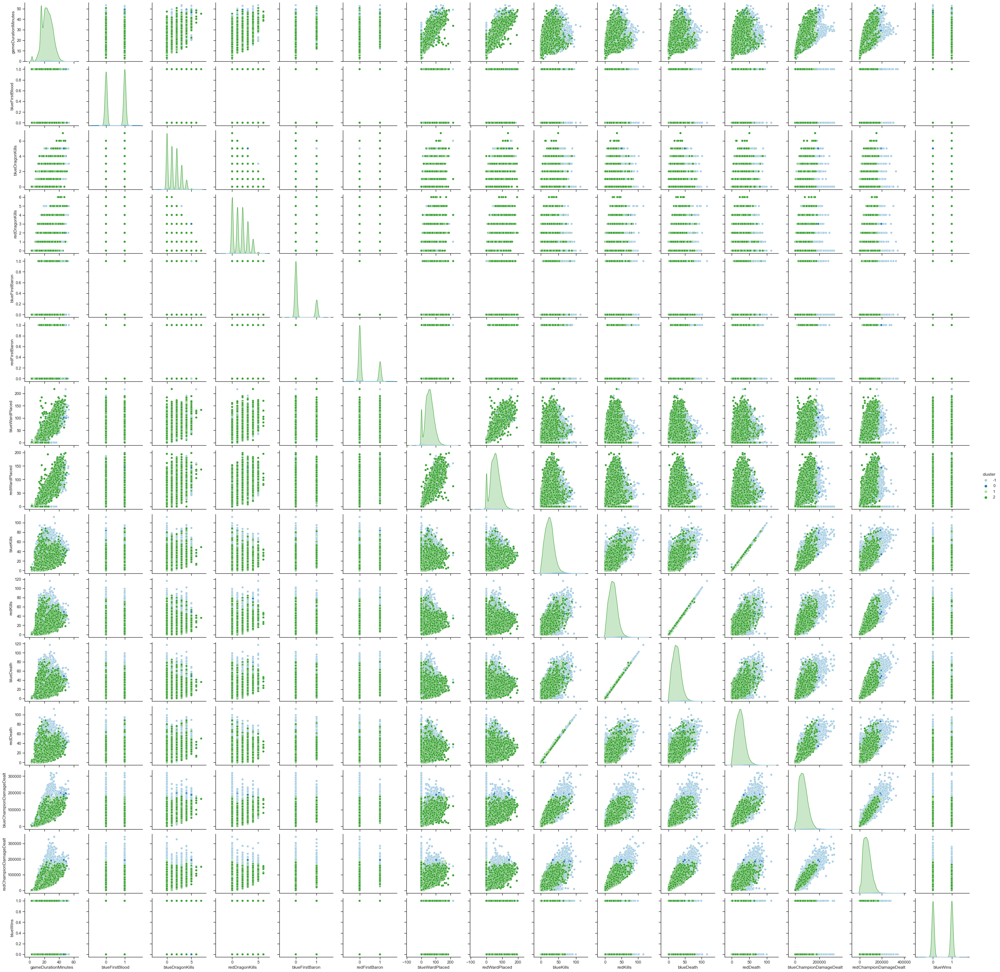

In [33]:
sns.set(style='ticks', color_codes=True)
sns.color_palette("tab10")
plt.figure(figsize=(26, 16))
sns.pairplot(df_matches_small, vars=cluster_features, hue='cluster', palette='Paired')

In [34]:
# Calc the percentage of each cluster corresponding to the data

percentage_clusterers = [len(df_matches_small.loc[df_matches_small['cluster'] == x]) / len(df_matches_small) for x in range(-1,clusters.labels_.max()+1)]
percentage_clusterers

# 97% perc of the data correspond to cluster 2, this is not good, we're gonna optimize the hyperparameters

[0.0255, 0.0006666666666666666, 0.0006388888888888889, 0.9731944444444445]

In [35]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import make_scorer

In [36]:
# Delete df_matches_small
df_matches_small= df_matches_small.iloc[:, :len(df_matches_small.columns)-1]

In [37]:
import hdbscan

hdb = HDBSCAN(gen_min_span_tree=True).fit(df_matches_small)


param_dist = {'min_samples': [10,30,50,60,100],
              'min_cluster_size':[100,200,300,400,500,600],  
              'cluster_selection_method' : ['eom','leaf'],
              'metric' : ['euclidean','manhattan'] 
             }

validity_scorer = make_scorer(hdbscan.validity.validity_index,greater_is_better=True)


n_iter_search = 20
random_search = RandomizedSearchCV(hdb
                                   ,param_distributions=param_dist
                                   ,n_iter=n_iter_search
                                   ,scoring=validity_scorer 
                                   ,random_state=31)

random_search.fit(df_matches_small)

print(f"Best Parameters {random_search.best_params_}")
print(f"DBCV score :{random_search.best_estimator_.relative_validity_}")


e:\kaggle\leagueoflegends\loldev\lib\site-packages\sklearn\model_selection\_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "e:\kaggle\leagueoflegends\loldev\lib\site-packages\sklearn\model_selection\_validation.py", line 760, in _score
    scores = scorer(estimator, X_test)
TypeError: __call__() missing 1 required positional argument: 'y_true'

  warnings.warn(
e:\kaggle\leagueoflegends\loldev\lib\site-packages\sklearn\model_selection\_validation.py:771: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "e:\kaggle\leagueoflegends\loldev\lib\site-packages\sklearn\model_selection\_validation.py", line 760, in _score
    scores = scorer(estimator, X_test)
TypeError: __call__() missing 1 required positional argument: 'y_true'

  warnings.warn(
e:\kag

Best Parameters {'min_samples': 100, 'min_cluster_size': 600, 'metric': 'manhattan', 'cluster_selection_method': 'eom'}
DBCV score :0.01866829464945885


In [38]:
# Calc the percentage of each cluster corresponding to the data
df_matches_small['cluster'] = random_search.best_estimator_.labels_

In [39]:
import numpy as np

labels = random_search.best_estimator_.labels_
clustered = (labels >= 0)
    
coverage = np.sum(clustered) / df_matches_small.shape[0]
total_clusters = np.max(labels) + 1
cluster_sizes = np.bincount(labels[clustered]).tolist()
percentage_clusterers = [len(df_matches_small.loc[df_matches_small['cluster'] == x]) / len(df_matches_small) for x in range(-1,clusters.labels_.max()+1)]

print(f"Percent of data retained: {coverage}")
print(f"Total Clusters found: {total_clusters}")
print(f"Cluster splits: {cluster_sizes}")
print(f"Cluster percentage: {percentage_clusterers}")

Percent of data retained: 0.4175
Total Clusters found: 3
Cluster splits: [677, 6970, 7383]
Cluster percentage: [0.5825, 0.018805555555555555, 0.19361111111111112, 0.20508333333333334]


<AxesSubplot:ylabel='$\\lambda$ value'>

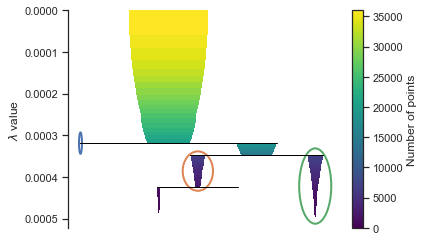

In [41]:
random_search.best_estimator_.condensed_tree_.plot(select_clusters=True,
                               selection_palette=sns.color_palette('deep', 8))

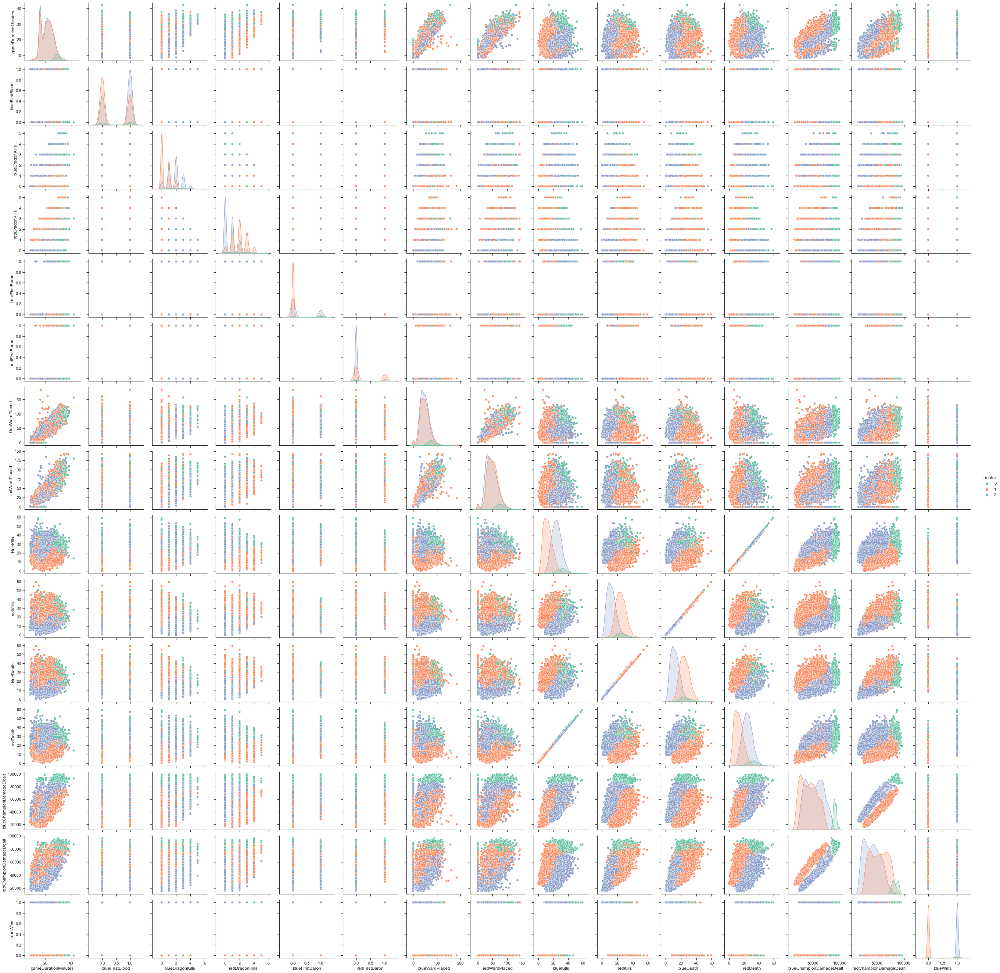

In [47]:
sns.set(style='ticks', color_codes=True)
sns.pairplot(df_matches_small.loc[df_matches_small['cluster'] >=0], vars=cluster_features, hue='cluster', palette='Set2')

In [48]:
df_matches_small.head(5)

,gameDurationMinutes,blueFirstBlood,blueDragonKills,redDragonKills,blueFirstBaron,redFirstBaron,blueWardPlaced,redWardPlaced,blueKills,redKills,blueDeath,redDeath,blueChampionDamageDealt,redChampionDamageDealt,blueWins,cluster
0,31.8,0,3,1,1,0,62,84,43,26,26,43,135355,100705,1,-1
1,24.2,0,3,0,1,0,48,49,40,25,25,40,75736,70660,1,2
2,24.2,1,3,1,0,1,69,71,20,21,21,20,71486,58082,0,2
3,30.5,0,0,4,0,0,59,67,28,48,48,28,74430,113195,0,-1
4,18.3,0,0,0,0,0,0,0,41,58,58,41,96554,126815,0,-1
